In [ ]:
!pip install geopandas > temp.txt
!pip install geopy > temp.txt
!pip install plotly > temp.txt

In [ ]:
%%time

import os
import boto3
import re
import sagemaker
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from multiprocessing import Pool
from time import sleep

role = sagemaker.get_execution_role()
region = boto3.Session().region_name

# S3 bucket for saving code and model artifacts.
# Feel free to specify a different bucket and prefix
bucket = sagemaker.Session().default_bucket()
# customize to your bucket where you have stored the data
bucket_path = "https://s3.console.aws.amazon.com/s3/buckets/robi-datathon-dataset-2022?region=ap-southeast-1&tab=objects".format(region, bucket)


CPU times: user 374 ms, sys: 40.1 ms, total: 414 ms
Wall time: 602 ms


In [ ]:
bucket

'sagemaker-us-east-1-191805398547'

In [ ]:
bucket = 'robi-datathon-dataset-2022/data/transaction'
data_key = 'part-00000-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv'
data_location = 's3://{}/{}'.format(bucket, data_key)

In [ ]:
data_location

's3://robi-datathon-dataset-2022/data/transaction/part-00000-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv'

** **

## **Checking Duplicates** - Random Sampling

In [ ]:
import random

df = pd.DataFrame()
for i in random.sample(range(0, 20), 4):
    data_key = f'part-0000{str(i).zfill(2)}-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv'
    data_location = 's3://{}/{}'.format(bucket, data_key)
    print(f'Reading {data_key}')
    df = pd.concat([df, pd.read_csv(data_location)])
    print(f'Read {data_key}')

print(f'Before dropping the duplicates: {df.shape}')
df = df.drop_duplicates()
print(f'After dropping the duplicates: {df.shape}')

Reading part-00004-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00004-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Reading part-00008-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00008-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Reading part-00009-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00009-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Reading part-00006-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00006-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Before dropping the duplicates: (19653189, 5)
After dropping the duplicates: (19653182, 5)


Dropped sample count: 7 <br>
Drop Percentage: 0.000035

In [ ]:
import random

df = pd.DataFrame()
for i in random.sample(range(0, 20), 4):
    data_key = f'part-000{str(i).zfill(2)}-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv'
    data_location = 's3://{}/{}'.format(bucket, data_key)
    print(f'Reading {data_key}')
    df = pd.concat([df, pd.read_csv(data_location)])
    print(f'Read {data_key}')

print(f'Before dropping the duplicates: {df.shape}')
df = df.drop_duplicates()
print(f'After dropping the duplicates: {df.shape}')

Reading part-00001-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00001-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Reading part-00013-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00013-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Reading part-00004-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00004-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Reading part-00005-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00005-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Before dropping the duplicates: (19653197, 5)
After dropping the duplicates: (19653193, 5)


Dropped sample count: 5 <br>
Drop Percentage: 0.000025

In [ ]:
del df

### **Considering this low ratio of duplicates we compromised the complete check considering the time constraint and other priorities**

** **

# **Visualizing all the *Retail Points* in Bangladesh**

Dropped all the points that were out side of the maximum rectangle that bounds Bangladesh

In [ ]:
data_location = 's3://robi-datathon-dataset-2022/data/agent.csv'

print(f'Reading {data_location}')
df_agent = pd.read_csv(data_location)
print(f'Read {data_location}')

Reading s3://robi-datathon-dataset-2022/data/agent.csv
Read s3://robi-datathon-dataset-2022/data/agent.csv


In [ ]:
retail_points = df_agent.drop(columns=['ts']).drop_duplicates()

In [ ]:
retail_points.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 109820 entries, 0 to 190795
Data columns (total 3 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   agent   109820 non-null  object 
 1   lat     89646 non-null   float64
 2   lon     89646 non-null   float64
dtypes: float64(2), object(1)
memory usage: 3.4+ MB


In [ ]:
retail_points['agent'].nunique()

109820

In [ ]:
retail_points.shape

(109820, 3)

In [ ]:
import json
bd_dist = json.load(open("bd.json", 'r'))

In [ ]:
retail_points = retail_points[retail_points['lon'] < 92.829626]
retail_points = retail_points[retail_points['lon'] > 87.904465]

retail_points = retail_points[retail_points['lat'] < 26.439529]
retail_points = retail_points[retail_points['lat'] > 20.126544]

In [ ]:
import plotly.express as px

fig = px.scatter_geo(retail_points,
    lat='lat',
    lon='lon',
    geojson=bd_dist,
    opacity=1,
    width=1080,
    height=1920,
    scope='asia'
)
fig.update_layout(title = 'Retail points', title_x=0.5)
fig.update_geos(fitbounds='locations', visible=False)
fig.show()

#issue with rendering | submitted the snapshot from the local environment

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning:

The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.



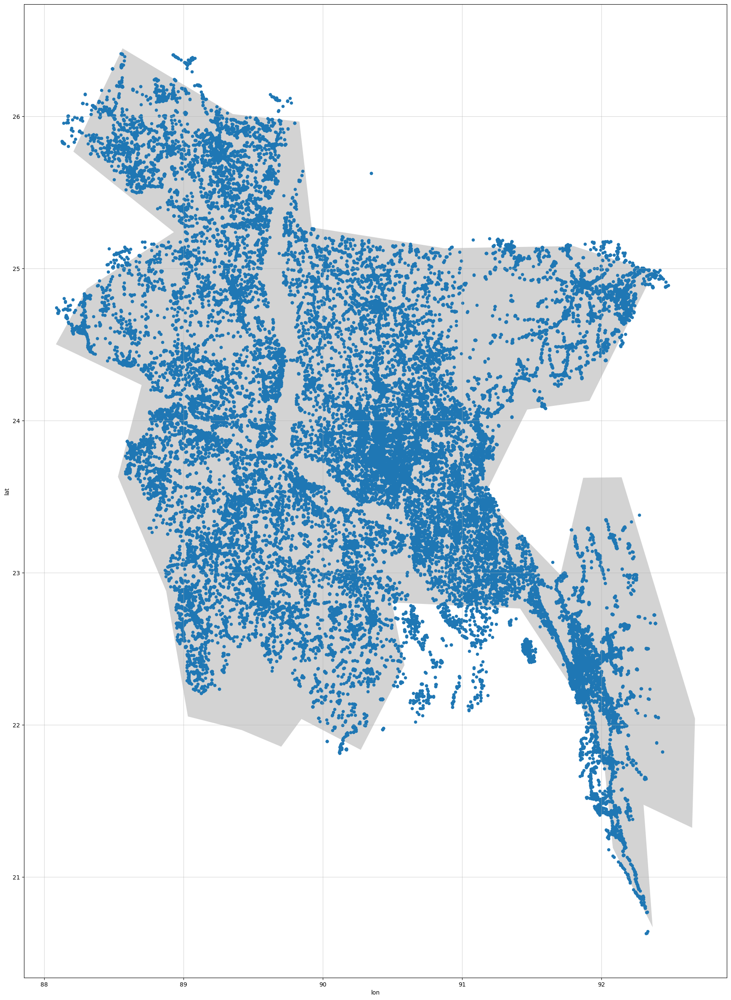

In [ ]:
import geopandas as gpd

# initialize an axis
fig, ax = plt.subplots(figsize=(40,30))
# plot map on axis
countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Bangladesh"].plot(color="lightgrey", ax=ax)
retail_points.plot(x="lon", y="lat", kind="scatter", ax=ax)

# add grid
ax.grid(visible=True, alpha=0.5)
plt.show()

**This plot is a substitute for the (high quality) plotly plot**

** **

# **How many geo-blocks (geohash of approx 1.2km x 0.6km) are there with retail?**

In [ ]:
# Maximum and minimum co-ordinates of a rectangule that bounds Bangladesh
max_coord = ( 26.439529, 92.829626) # (lat, lon) roughly estimated from map
min_coord = ( 20.126544, 87.904465) # (lat, lon) roughly estimated from map

In [ ]:
# lat 0.010852 = 1.2km roughly estimated from 
# lon 0.005405 = 0.6km roughly estimated from
lats = [x for x in np.arange(20.126544, 26.439529, 0.010852)] # creating lat dividers
lons = [x for x in np.arange(87.904465, 92.829626, 0.005405)] # creating lon dividers

In [ ]:
print(len(lats))
print(len(lons))

582
912


In [ ]:
rows = []
for lat in lats:
    for lon in lons:
        rows.append([lat, lon, lat+0.010852, lon+0.005405])

In [ ]:
rows = np.array(rows)
print(rows.shape)

(530784, 4)


In [ ]:
geo_boxes = pd.DataFrame(rows, columns=['min_lat', 'min_lon', 'max_lat', 'max_lon',]) #creating grid

In [ ]:
data_location = 's3://robi-datathon-dataset-2022/data/agent.csv'

print(f'Reading {data_location}')
df_agent = pd.read_csv(data_location)
print(f'Read {data_location}')
df_agent = df_agent.drop(columns=['ts'])
df_agent = df_agent.dropna() 
df_agent.head()

Reading s3://robi-datathon-dataset-2022/data/agent.csv
Read s3://robi-datathon-dataset-2022/data/agent.csv


,agent,lat,lon
0,632791e6ac867e8257e6fccb2f5ef5eb8e6eed8ee2bd03...,23.541481,89.170306
1,c48ff60fa46230c0ebbcfa1e7064224bda84952554f6ff...,23.486257,89.251074
2,264c4537ccffb2b544ed7f4bac7d8cf04f08ccb23ea634...,23.563920,89.047684
4,5a226d44dec4bae00991d8e8d9ae370a77640e7e62734f...,23.553360,89.098775
5,7b9544348c87e23a65f35857e3299cdb0cc2c6e1dec927...,23.560007,89.083078


In [ ]:
temp_count = []
for row in geo_boxes.values:
    temp_count.append(df_agent[df_agent['lat'].between(row[0], row[2]) & df_agent['lon'].between(row[1], row[3])].shape[0])

geo_boxes['count'] = temp_count

In [ ]:
geo_boxes = pd.DataFrame(geo_boxes)

In [ ]:
geo_boxes[geo_boxes['count'] > 0].shape[0]

23901

**Finding** There are **23901** geo-blocks (geohash of approx 1.2km x 0.6km) with retail points

** **

# **For next 10 retailer deployments, which geo-blocks should be targeted? What other info will complement this decision? Add relevant external data to support your recommendation and use visuals.**

## We propose 2 particular characteristics of locations where to deploy new retailers
* **Areas with high traffic and low number of retailers**<br> There are areas in Chittagong that have high transaction count but there are retail points with no other retail points near them. So, there is a chance that in such high traffic area low number of retails can be a bottle neck. So deploying new in such geo-blocks will increase through-put
* **Areas with no MFS retailers**<br> In this specific approach *Market analysis* is required. New retails should be deployed in places where banks or MFS has not been reached to create new customer base.

** **

# **What is peak hour in terms of number of transactions?**

**Proposed**: group by hour each transaction dataset > created (key, value) pair where key is hour and value is the number of transaction > Aggregated all the counts based on the key for all transactions > Got the hour (key) with maximum aggregated count of transactions

**Assumption**: Each slice has consecutive samples

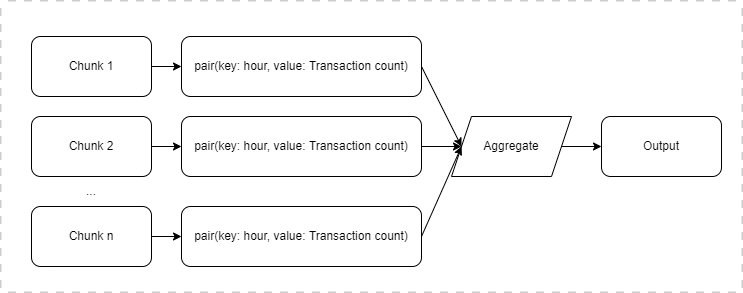

In [ ]:
map_hour = [0.0]*24

for i in range(0, 20):
    data_key = f'part-000{str(i).zfill(2)}-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv'
    data_location = 's3://{}/{}'.format(bucket, data_key)
    print(f'Reading {data_key}')
    df = pd.read_csv(data_location)
    print(f'Read {data_key}')
    df = df.dropna()
    print(f'Dropped Nones')
    df['ts'] = pd.to_datetime(df['ts'], format='%Y-%m-%d %H:%M:%S')
    print(f'Converted timeseries')
    temp_2 = df.groupby(df["ts"].dt.hour).count()['agent'].values
    print(f'Group by')
    lists_of_lists = [map_hour, temp_2]
    temp = [sum(x) for x in zip(*lists_of_lists)]

Reading part-00000-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00000-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Converted timeseries
Group by
Reading part-00001-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00001-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Converted timeseries
Group by
Reading part-00002-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00002-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Converted timeseries
Group by
Reading part-00003-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00003-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Converted timeseries
Group by
Reading part-00004-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00004-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Converted timeseries
Group by
Reading part-00005-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00005-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Conv

In [ ]:
max_value = max(temp)
print(max_value)
max_index = temp.index(max_value)
print(max_index)

620407.0
19


**Finding** 19th hour which means **7:00PM** is the peak hour considering count of transactions

** **

# **What is peak hour in terms of sales?**

**Proposed**: group by hour each transaction dataset > created (key, value) pair where key is hour and value is the aggregated value of the transactions > Aggregated all the counts based on the key for all transactions > Got the hour (key) with maximum aggregated sum of price.

**Assumption**: Each slice has consecutive samples

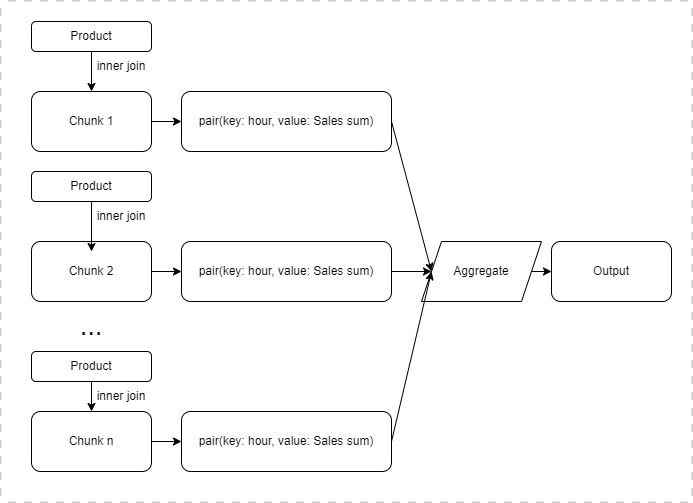

In [ ]:
data_location = 's3://robi-datathon-dataset-2022/data/product.csv'

print(f'Reading {data_location}')
df_prod = pd.read_csv(data_location)
print(f'Read {data_location}')

Reading s3://robi-datathon-dataset-2022/data/product.csv
Read s3://robi-datathon-dataset-2022/data/product.csv


In [ ]:
df_prod.head()

,price,dt,product
0,4.00,20220101,Product1
1,7.00,20220310,Product2
2,8.00,20220101,Product3
3,9.00,20220101,Product4
4,9.02,20220305,Product5


In [ ]:
map_hour = [0.0]*24

for i in range(0, 10):
    data_key = f'part-000{str(i).zfill(2)}-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv'
    data_location = 's3://{}/{}'.format(bucket, data_key)
    print(f'Reading {data_key}')
    df = pd.read_csv(data_location)
    print(f'Read {data_key}')
    df = df.dropna()
    print(f'Dropped Nones')
    df = pd.merge(df, df_prod, on=['product'])
    df['ts'] = pd.to_datetime(df['ts'], format='%Y-%m-%d %H:%M:%S')
    print(f'Converted timeseries')
    temp_2 = df.groupby(df["ts"].dt.hour).sum()['price']
    print(f'Group by')
    lists_of_lists = [map_hour, temp_2]
    temp = [sum(x) for x in zip(*lists_of_lists)]

Reading part-00000-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00000-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Converted timeseries
Group by
Reading part-00001-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00001-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Converted timeseries
Group by
Reading part-00002-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00002-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Converted timeseries
Group by
Reading part-00003-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00003-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Converted timeseries
Group by
Reading part-00004-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00004-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Converted timeseries
Group by
Reading part-00005-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00005-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Conv

In [ ]:
max_value = max(temp)
print(max_value)
max_index = temp.index(max_value)
print(max_index)

31492866.03
19


**Finding** 19th hour which means **7:00PM** is the peak hour considering sales

** **

# **What is the peak hour in summer and winter? Explain impact of seasonality. Use external data to support your explanation**

## Winter and Summer Peak hour based on number of transactions

In [ ]:
map_winter = [0.0]*24
map_summer = [0.0]*24

for i in range(0, 20):
    data_key = f'part-000{str(i).zfill(2)}-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv'
    data_location = 's3://{}/{}'.format(bucket, data_key)
    print(f'Reading {data_key}')
    df = pd.read_csv(data_location)
    print(f'Read {data_key}')
    df = df.dropna()
    print(f'Dropped Nones')
    df['ts'] = pd.to_datetime(df['ts'], format='%Y-%m-%d %H:%M:%S')
    df_winter = df[df['ts'].dt.month.isin([1, 2])]
    df_summer = df[df['ts'].dt.month.isin([3, 4, 5])]
    print(f'Converted to timeseries and filtered')
    temp_w = df_winter.groupby(df_winter["ts"].dt.hour).count()['agent'].values
    temp_s = df_summer.groupby(df_summer["ts"].dt.hour).count()['agent'].values
    print(f'Group by')
    lists_of_winter = [map_winter, temp_w]
    lists_of_summer = [map_summer, temp_s]
    temp_winter = [sum(x) for x in zip(*lists_of_winter)]
    temp_summer = [sum(x) for x in zip(*lists_of_summer)]

Reading part-00000-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00000-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Converted to timeseries and filtered
Group by
Reading part-00001-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00001-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Converted to timeseries and filtered
Group by
Reading part-00002-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00002-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Converted to timeseries and filtered
Group by
Reading part-00003-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00003-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Converted to timeseries and filtered
Group by
Reading part-00004-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read part-00004-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Dropped Nones
Converted to timeseries and filtered
Group by
Reading part-00005-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv


In [ ]:
max_value = max(temp_summer)
print(max_value)
max_index = temp_summer.index(max_value)
print(max_index)

354883.0
19


In [ ]:
max_value = max(temp_winter)
print(max_value)
max_index = temp_winter.index(max_value)
print(max_index)

213118.0
18


**Finding** <br>19th hour which means **7:00PM** is the peak hour in Summer. <br>18th hour which means **6:00PM** is the peak hour in Winter. <br>**Assumption** High traffic basically correlates with the **day-end**


** **

# **Which customer was travelling the most?**

**Proposed**: group by customer > sorted by timestamp > distance between consecutive samples > Sum-up all distance for each customer > save list of distance for customers(key) for each slice > merge the lists for all slices by summing up against keys > get highest distance.

**Assumption**: Each slice has consecutive samples

*Processes are done using multiprocessing nad numpy arrays for faster execution*

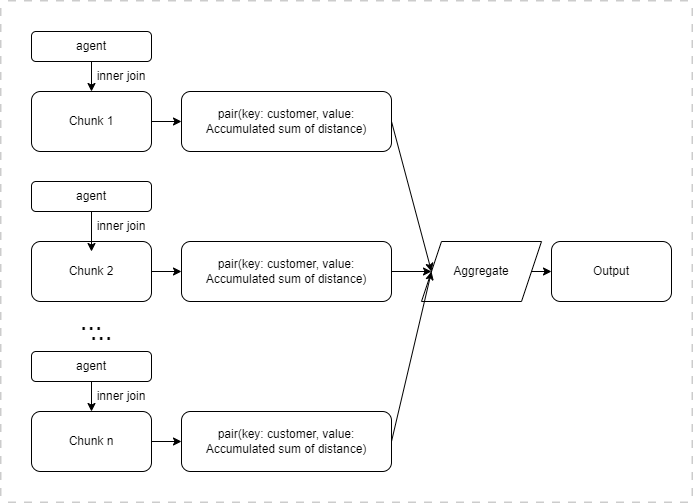

In [ ]:
data_location = 's3://robi-datathon-dataset-2022/data/agent.csv'

print(f'Reading {data_location}')
df_agent = pd.read_csv(data_location)
print(f'Read {data_location}')

Reading s3://robi-datathon-dataset-2022/data/agent.csv
Read s3://robi-datathon-dataset-2022/data/agent.csv


In [ ]:
df_agent = df_agent.drop(columns=['ts'])

In [ ]:
df_agent = df_agent.dropna()
df_agent.head()

,agent,lat,lon
0,632791e6ac867e8257e6fccb2f5ef5eb8e6eed8ee2bd03...,23.541481,89.170306
1,c48ff60fa46230c0ebbcfa1e7064224bda84952554f6ff...,23.486257,89.251074
2,264c4537ccffb2b544ed7f4bac7d8cf04f08ccb23ea634...,23.563920,89.047684
4,5a226d44dec4bae00991d8e8d9ae370a77640e7e62734f...,23.553360,89.098775
5,7b9544348c87e23a65f35857e3299cdb0cc2c6e1dec927...,23.560007,89.083078


In [ ]:
from geopy import distance
def sum_dist(df_x):
    sum = 0
    p1 = (0.0, 0.0)
    idx = 0
    for row in df_x.values:
        if idx == 0:
            # print("skipped")
            p1 = (row[5], row[6])
            idx = idx + 1
            continue
        
        p2 = (row[5], row[6])
        sum += distance.great_circle(p1, p2).km
        # print(f'Exec: {p1} {p2}: {sum}')
        p1 = p2
        idx = idx + 1
    return(sum)

In [ ]:
dicts = []

for i in range(0, 10):
    data_key = f'part-000{str(i).zfill(2)}-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv'
    data_location = 's3://{}/{}'.format(bucket, data_key)
    print(f'Reading {data_key}')
    df = pd.read_csv(data_location)
    print(f'Read')
    df = df.dropna()
    print(f'Dropped Nones')
    df = pd.merge(df, df_agent, on=['agent'])
    temp_2 = df.groupby(df["customer"]).apply(sum_dist)
    print(f'Group by')
    dicts.append(temp_2.to_dict())

Reading part-00000-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00001-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00002-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00003-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00004-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00005-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00006-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00007-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00008-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00009-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00010-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read


In [ ]:
from collections import Counter
c = Counter()
for d in dicts:
    c.update(d)

In [ ]:
del dicts

c = dict(c)
Keymax = max(zip(c.values(), c.keys()))[1]
print(Keymax)

Customer_8401294


**Finding** **Customer_8401294** travelled maximum

** **

# **Among highest selling top 100 retail, how many retail points have no other retail point nearby within 500 meter? What should be your recommendation for such retail points? Show examples of such retail on map to explain your recommendation, if you find any.**

## **Finding top 100 retail points**

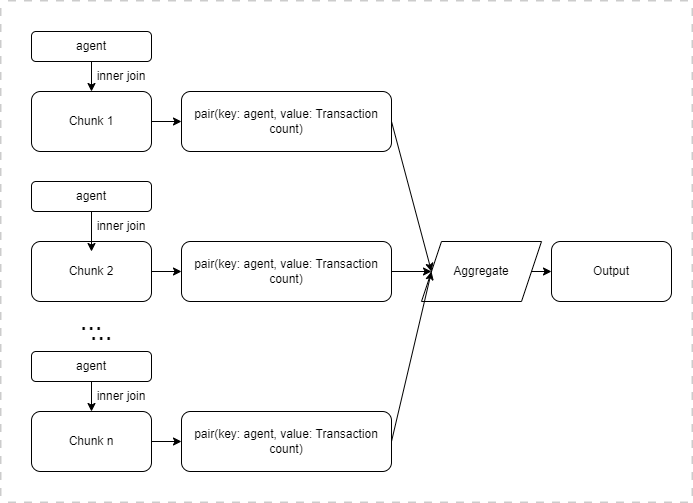

In [ ]:
dicts = []

for i in range(0, 20):
    data_key = f'part-000{str(i).zfill(2)}-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv'
    data_location = 's3://{}/{}'.format(bucket, data_key)
    print(f'Reading {data_key}')
    df = pd.read_csv(data_location)
    print(f'Read')
    df = df.dropna()
    print(f'Dropped Nones')
    df = pd.merge(df, df_agent, on=['agent'])
    temp_2 = df.groupby(df["agent"]).count()['product']
    print(f'Group by')
    dicts.append(temp_2.to_dict())

Reading part-00000-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00001-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00002-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00003-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00004-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00005-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00006-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00007-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00008-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00009-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read
Dropped Nones
Group by
Reading part-00010-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv
Read


In [ ]:
from collections import Counter
c = Counter()
for d in dicts:
    c.update(d)

In [ ]:
temp = pd.DataFrame(dict(c).items(), columns=['Agent', 'Transaction Count'])

In [ ]:
temp = temp.sort_values(by=['Transaction Count'], ascending=False).head(100)

In [ ]:
temp.head(20)

,Agent,Transaction Count
17177,3597e9c320bf42227f018874ea95d3927ac8a90c203357...,172384
64646,c92e6f7611a5f1d0d8398ddb8b89e0a16ade36e4372549...,139168
37493,751bb91b04df6944df2fddbeaf2e1b1bd47514d22e332a...,92940
4116,0cedf61ee96c949b630f2cfde70c07bb23eac4d510b0b4...,85740
22602,469a725a9cdee6fda6662fb7e11f38aae824a59ead84c4...,77190
36952,73841e03af565ea60059c7f665d6282f3f9b753d6f1889...,75368
5251,104d06929dce7669b6fb7f4e6f5b65b26da290dbd6b170...,69920
17611,37104687943b6f149df01edfc0de1c6e34061badece8c9...,66348
72774,e1f8f7fcef91dfbd89f6eda53d2023ea8fdadb957408b4...,65812
35123,6ddedc7f3bfabf690d0b466190c6a3fff8db3ab5aaed73...,64134


## **Finding retail points having no other retail points within 500 meter radius**

In [ ]:
retail_points

,agent,lat,lon
0,632791e6ac867e8257e6fccb2f5ef5eb8e6eed8ee2bd03...,23.541481,89.170306
1,c48ff60fa46230c0ebbcfa1e7064224bda84952554f6ff...,23.486257,89.251074
2,264c4537ccffb2b544ed7f4bac7d8cf04f08ccb23ea634...,23.563920,89.047684
4,5a226d44dec4bae00991d8e8d9ae370a77640e7e62734f...,23.553360,89.098775
5,7b9544348c87e23a65f35857e3299cdb0cc2c6e1dec927...,23.560007,89.083078
...,...,...,...
190786,21af582a111539f408a5fdc75e539a99e6657ba09e0ecf...,22.928587,91.324966
190787,3e000a511d22a7fbd12e88a341c7b244712c04423a04cf...,22.946775,91.274510
190788,4437ab436e1ae13242b618f9257e8bec8c978ebc87b993...,22.953144,91.325529
190789,4600a270cbf8c95a342d85cd91d5ac579e40d6c87e49d3...,22.901498,91.273151


In [ ]:
from geopy import distance

res_agents = []
for agent in temp['Agent'].values:
#     print(agent)
    sample = retail_points[retail_points['agent'] == agent]
#     print(sample)
    ref_point = (float(sample['lat']), float(sample['lon']))
    
    flag = True
    for row in retail_points.values:
        if row[0] == agent:
            # print("skipped")
            continue
        other_point = (row[1], row[2])
#         print(ref_point)
#         print(other_point)
        dist = distance.great_circle(ref_point, other_point).m
        if dist <= 500:
            flag = False
            print(f'Skipping')
            break
    if flag:
        res_agents.append(agent)

In [ ]:
res_agents

['5f019cfb681d7895bc6c5807e0280735aaae44907e45c4ce917316c546a9338e',
 'b2087ff3e86245db24fcfb9dc022d720083c677c6499848112b3b4ffe7372998',
 '665f437ca48ade31a26516c5825094931893f57669685070b01f108b2b025b3c',
 '69fd9e45f971ce147a759988451aa4faff1c6bd8170376da04a48aea9fcec3b4',
 '2fc5e292de69a2d167c540f3936c7b0afaa6c51b99290ff8535a11137ac5af3a',
 'fa14a746148993291a7629f667aa5a1c116ce11b4c0d68d70dabf41c4cc780b5',
 'd33ad9bb4b616ddd154a72183d4a2d53dc50f4d1fb8efc85dba8a52d87b763f9']

In [ ]:
temp_retails = retail_points[retail_points['agent'].isin(res_agents)]

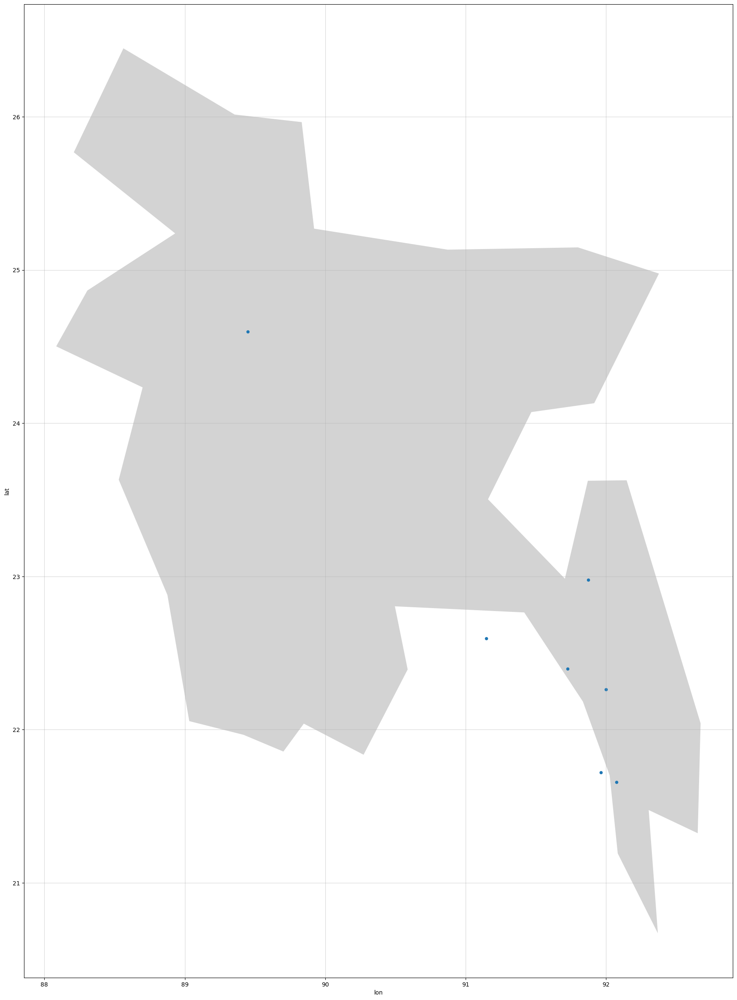

In [ ]:
import geopandas as gpd

# initialize an axis
fig, ax = plt.subplots(figsize=(40,30))
# plot map on axis
countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
countries[countries["name"] == "Bangladesh"].plot(color="lightgrey", ax=ax)
temp_retails.plot(x="lon", y="lat", kind="scatter", ax=ax)

# add grid
ax.grid(visible=True, alpha=0.5)
plt.show()

** **

# **For your next big billboard placement, which location will be best and which one product will feature in that billboard?**

* **Concern regarding retaining customers** <br>We can place the billboard in the most saturated area and the item on the billboard can be our next big thing along with the most popular product.
* **Tourist spots** <br>Another criterion for choice can be, depending on the traffic pattern we can place our bill-board on the tourist spots. This can give the customers confidence about the availability of the services in distant places.

** **

# **Find out retails serving highest number of travelers? What other business ideas can be implemented to maximize sales from these points?**

# Scopes to look for:
* Look for top selling products among the travelers
* See the price range, other features of the products (if those are travel-friendly)
* Competitor analysis

** **

# **From the data, can you find which areas are Residential, Tourist spots, Transit hubs, Corporate area**

# Proposed solution
* **Residential** <br>accessed repeatedly for long duration of time
* **Tourist spots** <br>accessed repeatedly for few days
* **Transit hubs** <br>High  traffic but less repetition
* **Corporate area** <br>High traffic in weekdays and working hours

** **

# **Create a sales forecast model for forecasting.**

Initially: try an LSTM based model (as continuous time series data) and a regression based approach as static features like (day of the week, weekend or work-day, etc can have an effect regardless of the previous sale). Then interpret the feature importances. Also, try out ensembling these approaches to see if there is a joint effect of these two different types of features and interpret the results to pivot to a better model.

** **

# **Multiprocessing for faster IO** *Failed with no error log*

In [ ]:
# param_list = []
# for i in range(0, 10):
#     data_key = f'part-0000{i}-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv'
#     data_location = 's3://{}/{}'.format(bucket, data_key)
#     param_list.append(data_location)
    
# for i in range(10, 20):
#     data_key = f'part-000{i}-afd80227-80b2-4b6a-aaaf-6e93851fc5cd-c000.csv'
#     data_location = 's3://{}/{}'.format(bucket, data_key)
#     param_list.append(data_location)
    
# param_list

In [ ]:
# def process_slices(data_location):
#     print(f"Reading {data_location}")
#     df = pd.read_csv(data_location)
#     print(f'Read')
#     df = df.dropna()
#     print(f'Dropped Nones')
#     df = pd.merge(df, df_agent, on=['agent'])
#     temp_2 = df.groupby(df["customer"]).apply(sum_dist)
#     print(f'Group by')
#     return temp_2.to_dict()

In [ ]:
# try:
#     pool = Pool(8) # on 8 processors
#     data_outputs = pool.map(process_slices, param_list)
# finally: # To make sure processes are closed in the end, even if errors happen
#     pool.close()
#     pool.join()

In [ ]:
# from collections import Counter
# c = Counter()
# for d in data_outputs:
#     c.update(d)

In [ ]:
# del data_outputs

In [ ]:
# dict(c)

In [ ]:
# c = dict(c)
# Keymax = max(zip(c.values(), c.keys()))[1]
# print(Keymax)

## **Draft**